<a href="https://colab.research.google.com/github/nicolastibata/MINE_4206_AML_202610/blob/main/labs/lab_1/MINE_4206_AML_202610_L1_S1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![Logo AML](https://github.com/nicolastibata/MINE_4206_AML_202610/blob/main/docs/logo.jpg?raw=true)

# **Laboratorio 1 - Sesión 1: Regresión Lineal**
**Tutor: Nicolás Tibatá**

## **Tabla de Contenido**

[Contexto y objetivos](#scrollTo=kgcjzQ76ODRS)<br>
[1. Introducción de los datos](#scrollTo=2dNwUTBZO8OE)<br>
[2. Preparación y Modelamiento](#scrollTo=SlV42CI6PBoQ)<br>
[3. Preguntas](#scrollTo=OCwUBTvxPRdS)<br>

### **Contexto y Objetivos**

El monitoreo físico de contaminantes (PM2.5​, NO2​) es costoso y limitado geográficamente. Este laboratorio utiliza el dataset  *UrbanAirNet* para sustituir sensores costosos por decisiones basados en datos con uso de Machine Learning. El objetivo es predecir la contaminación usando solo variables meteorológicas básicas (Temperatura, Humedad, Viento).

- Análisis Exploratorio: Identificar mediante correlaciones cuáles variables climáticas tienen una relación lineal más fuerte con la calidad del aire.
- Preprocesamiento de Datos: Manejar valores nulos y realizar el escalado de características para asegurar que el modelo converja eficientemente.
- Construir y evaluar un modelo de Regresión Lineal.

**Datos:** [UrbanAirNet](https://www.kaggle.com/datasets/ziya07/urbanairnet-urban-air-quality-and-weather-dataset)

**Diccionario**
| Columna | Descripción |
| :--- | :--- |
| **Station_ID** | Identificador de la estación de monitoreo |
| **DateTime** | Marca de tiempo (YYYY-MM-DD HH:MM:SS) |
| **PM2.5, PM10** | Concentración de material particulado ($\mu g/m^3$) |
| **NO2, SO2, CO, O3** | Niveles de gases contaminantes ($ppm$ o $\mu g/m^3$) |
| **Temp_C** | Temperatura en grados Celsius (°C) |
| **Humidity_%** | Humedad relativa (%) |
| **Wind_Speed_mps** | Velocidad del viento ($m/s$) |
| **Wind_Direction_deg**| Dirección del viento en grados (°) |
| **Pressure_hPa** | Presión atmosférica ($hPa$) |
| **Rain_mm** | Precipitación pluvial ($mm$) |
| **AQI_Target** | **Variable Objetivo:** Índice de Calidad del Aire simplificado |

### **1. Introducción a los datos**

In [69]:
# Importamos o instalamos librerias necesarias
!pip install ydata-profiling -q
from ydata_profiling import ProfileReport
# Acceso a credenciales
import os
from google.colab import files
from google.colab import userdata
# Manejo de datos
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# Modelamiento
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

Cargamos los datos directamente de kaggle con las credenciales personales, pueden consultar cómo funciona [acá](https://www.kaggle.com/discussions/general/74235#2580958).

In [52]:
os.environ["KAGGLE_KEY"] = userdata.get('KAGGLE_KEY')
os.environ["KAGGLE_USERNAME"] = userdata.get('KAGGLE_USERNAME')

!kaggle datasets download -d ziya07/urbanairnet-urban-air-quality-and-weather-dataset
!unzip "urbanairnet-urban-air-quality-and-weather-dataset.zip"

Dataset URL: https://www.kaggle.com/datasets/ziya07/urbanairnet-urban-air-quality-and-weather-dataset
License(s): CC0-1.0
urbanairnet-urban-air-quality-and-weather-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  urbanairnet-urban-air-quality-and-weather-dataset.zip
replace UrbanAirPollutionDataset.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [70]:
data = pd.read_csv('UrbanAirPollutionDataset.csv')
data.info()
data.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 175205 entries, 0 to 175204
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Station_ID          175205 non-null  int64  
 1   DateTime            175205 non-null  object 
 2   PM2.5               175205 non-null  float64
 3   PM10                175205 non-null  float64
 4   NO₂                 175205 non-null  float64
 5   SO₂                 175205 non-null  float64
 6   CO                  175205 non-null  float64
 7   O₃                  175205 non-null  float64
 8   Temp_C              175205 non-null  float64
 9   Humidity_%          175205 non-null  float64
 10  Wind_Speed_mps      175205 non-null  float64
 11  Wind_Direction_deg  175205 non-null  float64
 12  Pressure_hPa        175205 non-null  float64
 13  Rain_mm             175205 non-null  float64
 14  AQI_Target          175205 non-null  float64
dtypes: float64(13), int64(1), object(1

,Station_ID,PM2.5,PM10,NO₂,SO₂,CO,O₃,Temp_C,Humidity_%,Wind_Speed_mps,Wind_Direction_deg,Pressure_hPa,Rain_mm,AQI_Target
count,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000,175205.000000
mean,3.000000,60.028063,89.970108,24.949886,10.002496,0.599942,30.001676,27.005798,64.957909,2.503360,179.974158,1009.999520,0.094649,43.499332
std,1.414218,19.993724,30.053351,9.964945,3.995001,0.199632,10.002468,4.992958,15.001583,1.003688,103.973354,4.996531,0.238989,10.627132
min,1.000000,-30.550414,-33.232821,-23.087190,-6.575932,-0.357247,-11.472321,3.083805,-3.501162,-1.857991,0.000541,987.584963,0.000000,-8.410248
25%,2.000000,46.556391,69.602188,18.246506,7.307356,0.465172,23.261060,23.647684,54.867365,1.827088,89.873992,1006.609210,0.000000,36.388595
50%,3.000000,59.950780,89.972045,24.966761,10.006975,0.599811,30.028232,27.017236,64.970205,2.503869,179.918778,1010.013031,0.000000,43.470426
75%,4.000000,73.515683,110.225852,31.685532,12.707325,0.734121,36.713979,30.370403,75.068157,3.177856,270.079199,1013.371262,0.000000,50.647114
max,5.000000,145.072926,224.750097,68.019015,28.328038,1.499890,75.843519,48.162096,130.720247,7.156243,359.998065,1033.106645,1.000000,89.239073


In [54]:
data

,Station_ID,DateTime,PM2.5,PM10,NO₂,SO₂,CO,O₃,Temp_C,Humidity_%,Wind_Speed_mps,Wind_Direction_deg,Pressure_hPa,Rain_mm,AQI_Target
0,1,2020-01-01 00:00:00,86.397213,111.814972,26.599649,3.875088,0.570793,42.903768,31.491409,45.704988,3.114026,166.148254,1012.641964,1.0,59.759255
1,1,2020-01-01 01:00:00,73.311679,110.919391,18.585412,11.820056,0.562121,15.127661,24.191965,41.544655,3.480094,282.158060,1011.779447,0.0,45.256996
2,1,2020-01-01 02:00:00,61.359818,47.063317,20.605215,16.531417,0.466105,32.752213,30.719383,73.849227,4.949460,109.450898,1004.118484,0.0,43.411916
3,1,2020-01-01 03:00:00,54.081632,122.981322,14.682654,14.453442,0.607025,18.910033,18.243150,42.086443,1.834147,229.796006,1009.154244,0.0,35.227619
4,1,2020-01-01 04:00:00,43.221175,102.259959,41.515463,17.495670,0.537119,39.582884,33.949777,42.393921,1.987593,159.501370,1021.100094,0.0,41.981803
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175200,5,2023-12-30 20:00:00,60.010320,95.408779,38.985652,9.635815,0.455887,37.390524,31.188920,65.472012,2.839655,242.198923,1019.407051,0.2,49.178960
175201,5,2023-12-30 21:00:00,85.776727,111.944941,20.843777,9.536969,0.764993,38.506328,21.094983,59.384117,3.346297,311.206169,1006.211655,0.0,56.842762
175202,5,2023-12-30 22:00:00,57.836385,113.044005,20.541992,8.475458,0.401075,52.263306,29.755230,67.450861,2.802787,308.604394,1009.150300,0.0,45.533451
175203,5,2023-12-30 23:00:00,58.691021,36.132643,42.932013,19.279567,0.506091,26.699367,30.126836,79.305358,2.758214,182.214616,1016.894754,0.0,47.564988


### **2. Preparación y Modelamiento**

Antes de preparar y modelar los datos, veamos un poco cómo se constituyen

In [55]:
ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:09<00:00,  1.55it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### **Preparación**

In [56]:
# 1. Separar los datos en entrenamiento y test -> SIEMPRE
train_data, test_data = train_test_split(data, test_size=0.2, random_state=71)
# 2. Separamos nuestras variables explicativas del target en nuestro set de entrenamiento
X_train, y_train = train_data.drop(['AQI_Target'], axis=1), train_data['AQI_Target']
display(X_train.head())
display(y_train.head())
display(X_train.shape)
display(y_train.shape)

,Station_ID,DateTime,PM2.5,PM10,NO₂,SO₂,CO,O₃,Temp_C,Humidity_%,Wind_Speed_mps,Wind_Direction_deg,Pressure_hPa,Rain_mm
74437,3,2020-06-30 11:00:00,49.558712,5.683274,30.347089,4.928705,0.320386,27.672781,26.109778,72.071685,2.214577,280.281568,1023.796801,0.0
119298,4,2021-08-13 15:00:00,66.430369,83.184197,21.502361,10.415006,0.316992,20.451451,22.457414,69.159569,2.194323,187.851776,1007.945624,0.0
100084,3,2023-06-04 02:00:00,53.969050,84.825087,49.935181,10.101541,0.626085,26.587934,35.157140,53.534991,4.288657,342.645667,1017.637291,0.0
131363,4,2022-12-29 08:00:00,40.078206,95.469880,9.782660,11.181070,0.716518,23.596407,26.012286,47.260566,1.049803,264.175108,1002.860703,0.0
135518,4,2023-06-20 11:00:00,51.333426,116.297500,33.774795,7.758233,0.422904,17.689748,33.644077,77.778975,3.319571,300.587970,1011.605902,0.0


,AQI_Target
74437,39.418039
119298,43.756183
100084,47.282666
131363,27.693182
135518,39.337101


(140164, 14)

(140164,)

In [57]:
# 3. Eliminamos columnas que no tienen importancia en nuestro lab (como los IDs, fechas o variables con una alta correlación)
X_train = X_train.drop(['Station_ID', 'DateTime', 'PM2.5'], axis=1)
# 4. Eliminamos filas nulas (si existen)
display(f"Total de filas nulas: {X_train.isnull().sum().sum()}") # No existen por lo tanto no eliminamos nulos
# 5. Eliminamos filas duplicadas (si existen)
display(f"Total de filas duplicadas: {X_train.duplicated().sum().sum()}") # No existen por lo tanto no eliminamos duplicados

'Total de filas nulas: 0'

'Total de filas duplicadas: 0'

In [58]:
# 6. Al solo tener variables numéricas (floats) entonces aplicamos StandardScaler a todas las variables explicativas
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled

array([[-2.80394805,  0.54306103, -1.2685463 , ...,  0.96365626,
         2.7578813 , -0.39541065],
       [-0.2256297 , -0.34424837,  0.10389351, ...,  0.07446814,
        -0.40941288, -0.39541065],
       [-0.17104018,  2.50815249,  0.02547805, ...,  1.56360803,
         1.52712213, -0.39541065],
       ...,
       [ 1.45900896,  0.09041613, -0.68249851, ..., -1.09745834,
        -0.82848026, -0.39541065],
       [-0.43835808,  1.66677523, -0.93058959, ...,  1.58477271,
        -0.22530561, -0.39541065],
       [ 0.26850255,  1.49355406,  0.60191353, ..., -0.70943755,
         0.51631385, -0.39541065]])

In [59]:
# 7. Al aplicar el scaler, debemos convertir nuestros datos a dataframe nuevamente
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)
X_train_scaled

,PM10,NO₂,SO₂,CO,O₃,Temp_C,Humidity_%,Wind_Speed_mps,Wind_Direction_deg,Pressure_hPa,Rain_mm
0,-2.803948,0.543061,-1.268546,-1.399082,-0.233136,-0.178481,0.474498,-0.287191,0.963656,2.757881,-0.395411
1,-0.225630,-0.344248,0.103894,-1.416054,-0.954979,-0.909775,0.280421,-0.307378,0.074468,-0.409413,-0.395411
2,-0.171040,2.508152,0.025478,0.129761,-0.341578,1.633024,-0.760871,1.779977,1.563608,1.527122,-0.395411
3,0.183093,-1.519977,0.295530,0.582026,-0.640610,-0.198002,-1.179027,-1.448083,0.808710,-1.425454,-0.395411
4,0.875991,0.886931,-0.560718,-0.886373,-1.231038,1.330072,0.854857,0.814120,1.159007,0.321964,-0.395411
...,...,...,...,...,...,...,...,...,...,...,...
140159,1.267380,0.572083,-0.082182,-0.035717,-0.275331,-0.371286,1.822550,-0.886938,-1.166497,-0.360324,-0.395411
140160,-0.179783,0.533393,0.953542,0.991995,-1.839762,-0.197710,0.164464,0.308677,-1.472570,0.440704,-0.395411
140161,1.459009,0.090416,-0.682499,0.216946,0.049740,-1.018581,0.167491,-1.749816,-1.097458,-0.828480,-0.395411
140162,-0.438358,1.666775,-0.930590,-0.666310,-0.825230,0.720618,0.199903,0.293520,1.584773,-0.225306,-0.395411


Si quieres saber más sobre como funciona el StandardScaler o sus alternativas, lo puedes consultar [acá](https://scikit--learn-org.translate.goog/stable/modules/generated/sklearn.preprocessing.StandardScaler.html?_x_tr_sl=en&_x_tr_tl=es&_x_tr_hl=es&_x_tr_pto=tc)

#### **Modelamiento**

Veamos un poco la importancia del scaled

**1. Creamos nuestros modelos, 1 sin el escalador, 2 con el escalador**

In [60]:
model1 = LinearRegression()
model1.fit(X_train, y_train)
print(f"Coeficientes: {model1.coef_}")
print(f"Intercepto: {model1.intercept_}")

Coeficientes: [-2.53771339e-04  3.01103327e-01  2.84240725e-03  1.44403746e-01
  1.98682996e-01  1.97076909e-03 -1.84283908e-03 -1.42015576e-02
 -1.43509044e-05  1.36922579e-02 -1.45143178e-01]
Intercepto: 16.220691071117688


In [61]:
model2 = LinearRegression()
model2.fit(X_train_scaled, y_train)
print(f"Coeficientes: {model2.coef_}")
print(f"Intercepto: {model2.intercept_}")

Coeficientes: [-7.62803901e-03  3.00140726e+00  1.13624657e-02  2.88742460e-02
  1.98762965e+00  9.84278514e-03 -2.76517769e-02 -1.42490439e-02
 -1.49175530e-03  6.85248640e-02 -3.46744521e-02]
Intercepto: 43.492893403589655


##### **Evaluación**

OJO! Siempre los pasos de procesamiento que aplicamos al set de entrenamiento, debemos aplicarlo al set de test. Para esto lo hacemos manual, en el próximo laboratorio lo generaremos con un pipeline.

In [62]:
# Aplicamos los pasos 2,3,4,5,6,7
# 2. Separamos nuestras variables explicativas del target en nuestro set de test
X_test, y_test = test_data.drop(['AQI_Target'], axis=1), test_data['AQI_Target']
display(X_test.head())
display(y_test.head())
display(X_test.shape)
display(y_test.shape)

,Station_ID,DateTime,PM2.5,PM10,NO₂,SO₂,CO,O₃,Temp_C,Humidity_%,Wind_Speed_mps,Wind_Direction_deg,Pressure_hPa,Rain_mm
124083,4,2022-03-01 00:00:00,55.303664,109.073695,36.323782,13.284328,0.488085,15.785708,31.855935,43.966138,1.369998,128.528697,1012.744595,0.0
95210,3,2022-11-13 00:00:00,74.168586,86.231034,30.254387,2.964864,0.466648,50.594041,28.237166,75.984869,2.168920,76.836646,1006.871879,0.0
20457,1,2022-05-02 09:00:00,90.944428,108.172958,24.521149,6.983279,0.575436,30.212228,40.536962,62.941799,2.530727,69.504295,1017.393854,1.0
140209,5,2020-01-02 21:00:00,73.177935,95.008009,43.658036,13.018994,0.612387,35.616643,29.790844,94.120349,1.979293,153.439299,1011.409415,0.0
63785,2,2023-04-12 16:00:00,54.556500,68.023052,13.720834,8.250073,0.729604,24.148059,20.030375,64.696411,0.958090,24.721702,1007.392381,0.0


,AQI_Target
124083,41.706108
95210,56.279418
20457,58.871004
140209,56.809707
63785,36.224112


(35041, 14)

(35041,)

In [63]:
# 3. Eliminamos columnas que no tienen importancia en nuestro lab o una alta correlación
X_test = X_test.drop(['Station_ID', 'DateTime', 'PM2.5'], axis=1)
# 4. Eliminamos filas nulas (si existen)
display(f"Total de filas nulas: {X_test.isnull().sum().sum()}") # No existen por lo tanto no eliminamos nulos
# 5. Eliminamos filas duplicadas (si existen)
display(f"Total de filas duplicadas: {X_test.duplicated().sum().sum()}") # No existen por lo tanto no eliminamos duplicados

'Total de filas nulas: 0'

'Total de filas duplicadas: 0'

In [64]:
# 6. Aplicamos el mismo StandardScaler del set de entrenamiento al set de test
X_test_scaled = scaler.transform(X_test)
X_test_scaled

array([[ 0.63566804,  1.14264715,  0.82167636, ..., -0.49622857,
         0.54949074, -0.39541065],
       [-0.12426682,  0.53376114, -1.75981612, ..., -0.99351367,
        -0.62396264, -0.39541065],
       [ 0.60570209, -0.04140145, -0.75457908, ..., -1.06405196,
         1.47848001,  3.79047171],
       ...,
       [-0.49837337, -0.31415991,  1.58693828, ..., -1.31898781,
        -0.41394589, -0.39541065],
       [ 0.30513548,  1.15845967, -0.02379345, ...,  1.61273294,
        -0.29898576,  0.44176582],
       [ 1.56340154,  0.2526337 , -0.63557987, ...,  1.525938  ,
         0.19981511, -0.39541065]])

In [65]:
# 7. Al aplicar el scaler, debemos convertir nuestros datos a dataframe nuevamente
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)
X_test_scaled

,PM10,NO₂,SO₂,CO,O₃,Temp_C,Humidity_%,Wind_Speed_mps,Wind_Direction_deg,Pressure_hPa,Rain_mm
0,0.635668,1.142647,0.821676,-0.560394,-1.421366,0.972042,-1.398583,-1.128955,-0.496229,0.549491,-0.395411
1,-0.124267,0.533761,-1.759816,-0.667605,2.058067,0.247475,0.735290,-0.332695,-0.993514,-0.623963,-0.395411
2,0.605702,-0.041401,-0.754579,-0.123544,0.020706,2.710198,-0.133959,0.027905,-1.064052,1.478480,3.790472
3,0.167728,1.878425,0.755301,0.061255,0.560930,0.558559,1.943920,-0.521691,-0.256585,0.282702,-0.395411
4,-0.730014,-1.124897,-0.437681,0.647471,-0.585467,-1.395728,-0.017024,-1.539491,-1.494867,-0.519959,-0.395411
...,...,...,...,...,...,...,...,...,...,...,...
35036,-0.136402,-1.001035,-0.481431,-0.603300,-1.644386,1.194066,0.872524,-0.467904,-0.185536,-0.194104,-0.395411
35037,0.492042,1.115200,-1.249439,0.708737,-0.291144,-0.620994,-2.303866,-0.338311,-0.783221,0.108722,-0.395411
35038,-0.498373,-0.314160,1.586938,0.384860,1.799798,0.800489,-0.582986,1.881522,-1.318988,-0.413946,-0.395411
35039,0.305135,1.158460,-0.023793,0.980863,-0.135636,-1.033476,0.144250,0.561409,1.612733,-0.298986,0.441766


Una vez aplicado los mismos pasos al set de test entonces evaluamos los modelos

In [66]:
y_pred1 = model1.predict(X_test)
y_pred1

n,p = X_test.shape
print('------------ Regresión Lineal ------------')
print("Sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred1))
print("Root of sum of squares (RMSE): %.2f" % mean_squared_error(y_test,y_pred1) ** (1/2))
print("R2-score: %.5f" % r2_score(y_test, y_pred1) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred1))*(n-1)/(n-p-1)) )

------------ Regresión Lineal ------------
Sum of squares (MSE): 100.72
Root of sum of squares (RMSE): 10.04
R2-score: 0.11482
Adj R2-score: 0.11454


In [67]:
y_pred2 = model2.predict(X_test_scaled)
y_pred2

n,p = X_test.shape
print('------------ Regresión Lineal ------------')
print("Sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred2))
print("Root of sum of squares (RMSE): %.2f" % mean_squared_error(y_test,y_pred2) ** (1/2))
print("R2-score: %.5f" % r2_score(y_test, y_pred2) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred2))*(n-1)/(n-p-1)) )

------------ Regresión Lineal ------------
Sum of squares (MSE): 100.72
Root of sum of squares (RMSE): 10.04
R2-score: 0.11482
Adj R2-score: 0.11454


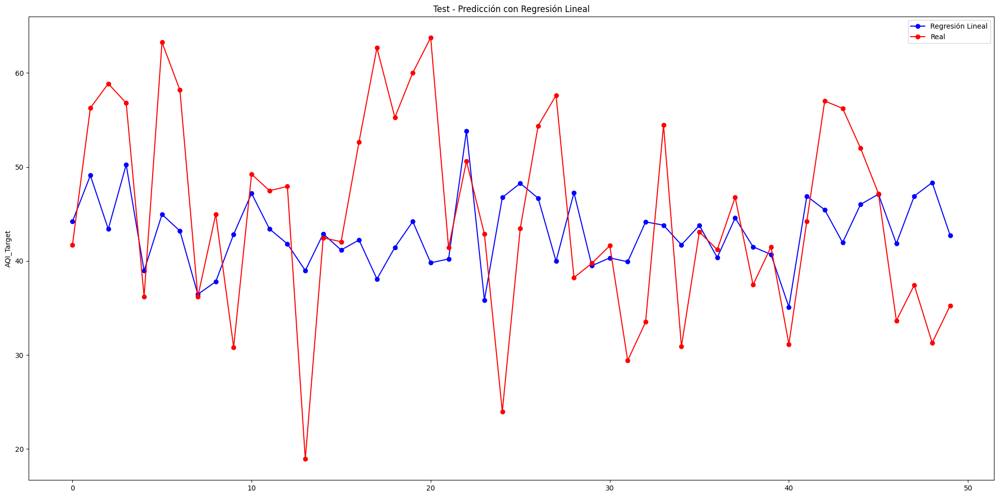

In [72]:
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_train[:50])))
axs.plot(xvals, y_pred2[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_test[:50],'ro-', label='Real')

axs.set(title='Test - Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

### **3. Preguntas**

1. ¿Por qué al aplicar StandardScaler genera los mismos resultados? Si genera los mismos resultados, entonces tiene alguna importancia el StandardScaler?
2. ¿Qué se puede hacer para obtener un mejor modelo? Sabiendo que el tamaño de nuestro dataset es bueno.
3. ¿Cuáles son los otros tipos de scalers que existen?